In [1]:
# %matplotlib inline
# %matplotlib widget
# %matplotlib notebook

import warnings
warnings.filterwarnings(action='ignore')

import sys
sys.path.append('../stimulus_core/')
sys.path.append('../models_core/')
sys.path.append('../helper/')

import os
import numpy as np
import tensorflow as tf
import random
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.patches import Circle
from matplotlib import cm
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
from mpl_toolkits.mplot3d import Axes3D
from mayavi import mlab
from scipy.spatial.transform import Rotation as R3d
import imageio
import time
import importlib
import glob
from scipy.ndimage import gaussian_filter
from PIL import Image
from datetime import datetime

import dynamics_3d as dn3d
import optical_signal as opsg
import predefined_weights as pdwt
import samples_generation_multi_units as smgnmu
import flow_field as flfd
import helper_functions as hpfn

In [2]:
figure_path = '/Volumes/Baohua/research/loom_detection/results/final_figures_for_paper_exp/'
if not os.path.exists(figure_path):
    os.makedirs(figure_path)
    

# Stimuli movies

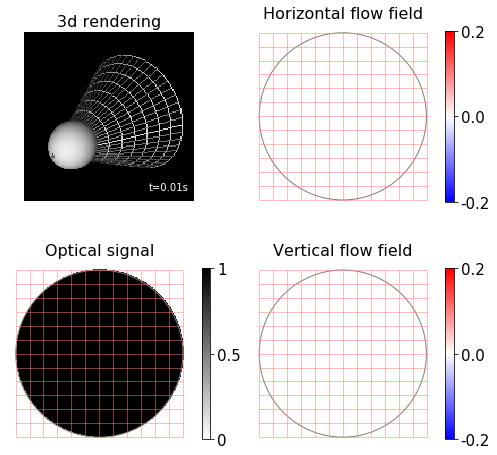

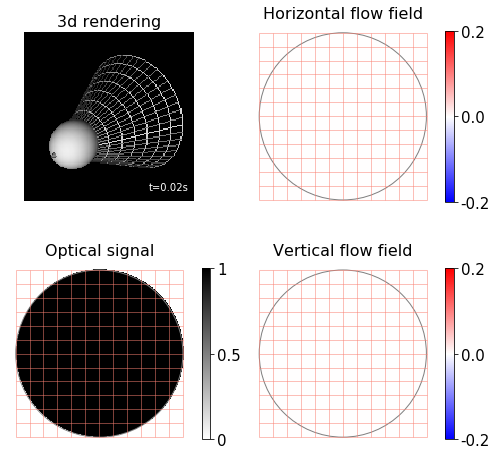

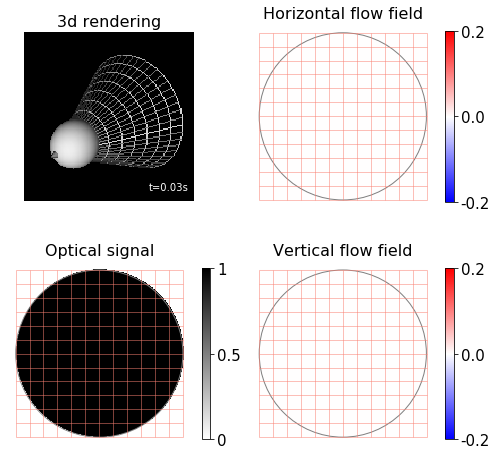

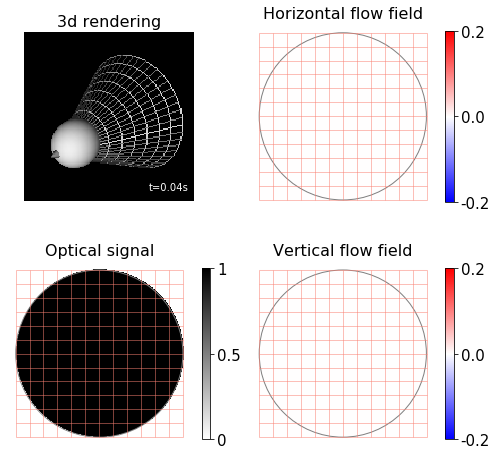

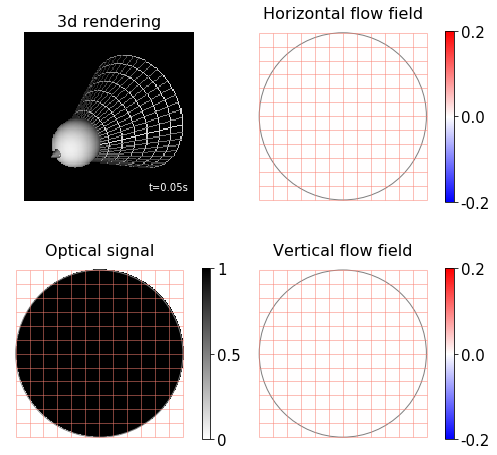

...

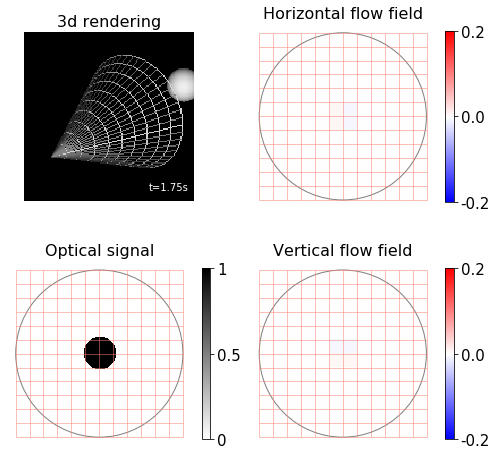

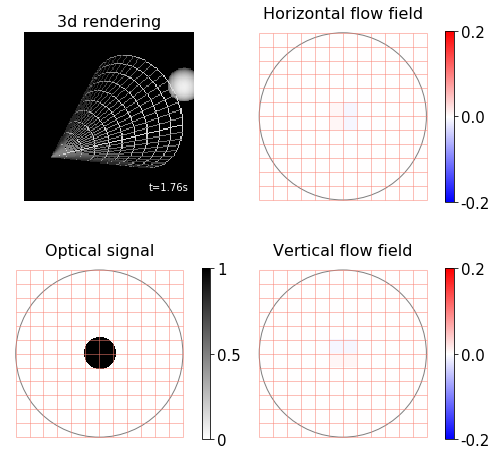

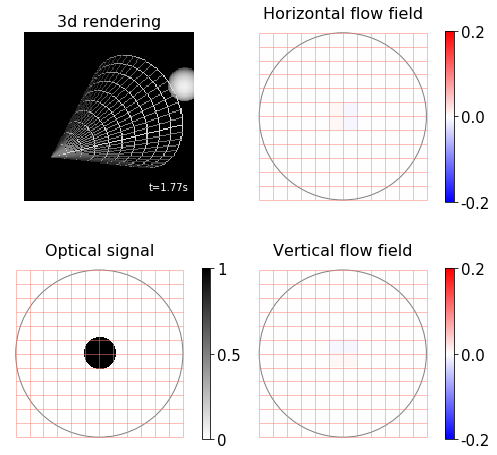

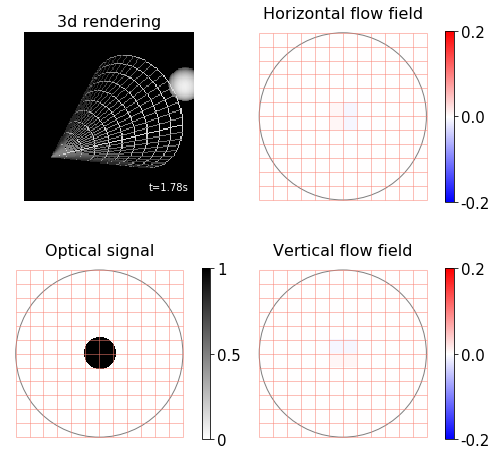

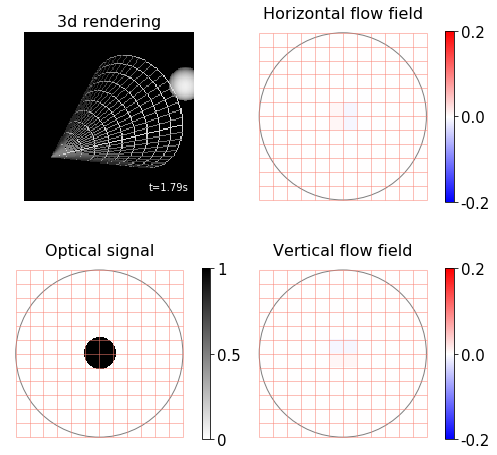

In [32]:
# Need to run get_samples_for_movie_single_unit.py and movie_3d.py first. Check movie_3d.ipynb
# Here, we combine 3d reconstruction, intensity and flow field together.

importlib.reload(opsg)
importlib.reload(flfd)
importlib.reload(hpfn)
importlib.reload(smgnmu)

#     mask_2 = np.logical_and(theta_matrix>=theta_r-0.01, theta_matrix<=theta_r+0.01)
#     mask_2 = mask_2[2*L:-2*L, 2*L:-2*L]

data_types = ['hit', 'miss', 'retreat', 'rotation']
data_type = data_types[2]

M = 1
R = 1 # radius of the ball (m)
Rs = np.array([R])
dt = 0.01 # time step (sec)
dynamics_fun = dn3d.dynamics_fun_zero_field # dynamics that is imposed on the object
eta_1 = 0. # random force added on the ball (m/sec^2)
sigma = 0. # noise added to images
theta_r = np.deg2rad(30) # half of the receptive field width (rad)
K = 12 # K*K is the total number of elements
L = 50 # L is the dimension of each element
pad = 2*L
leftup_corners = opsg.get_leftup_corners(K, L, pad)
sample_dt = 0.01 # sampling resolution
delay_dt = 0.03 # delay in the motion detector
D_max = 10.1*R # maximum initial distance (m)
myheat = LinearSegmentedColormap.from_list('br', ["b", "w", "r"], N=256)
save_path = figure_path+'movies/stimuli/movie_frames/'+data_type+'/'
save_path_3d = figure_path+'movies/stimuli/movie_frames_3d/'+data_type+'/'
frames_sample = np.load(save_path+'frames_sample.npy', allow_pickle=True)
UV_flow_sample = np.load(save_path+'UV_flow_sample.npy', allow_pickle=True)
steps = len(frames_sample)
v_max = 0.2
combined_movies_list = []
for step in range(steps):
#     im_3d = imageio.imread('../results/FiguresForPaper/movie_frames_3d/'+data_type+'/'+'image3d_{}.png'.format(step+1))
    cf = frames_sample[step]
    UV_flow = UV_flow_sample[step]
    
    N = K*L
    N_half = (N-1)/2.
    
    fig = plt.figure(figsize=(8, 8))
    gs0 = gridspec.GridSpec(2, 2, figure=fig)
    
    gs00 = gridspec.GridSpecFromSubplotSpec(14, 14, subplot_spec=gs0[0, 0])
    ax1 = fig.add_subplot(gs00[1:13, 1:13])
    filename = save_path_3d+'image3d_{}'.format(step+1)
    im = Image.open(filename)
    ax1.imshow(im)
    ax1.text(110, 140, f't={np.round((step+1)*0.01, 2)}s', color='w')
    ax1.set_title('3d rendering', fontsize=16)
    ax1.axis('off')

    ax2 = fig.add_subplot(gs0[1, 0])
    cf = np.array(cf)
#         cf[0, mask_2] = 1
    im2 = ax2.imshow(cf[0, :, :], cmap='gray_r', vmin=0, vmax=1)
    cbar = plt.colorbar(im2, ax=ax2, orientation='vertical', fraction=.042, ticks=[0, 0.5, 1])
    cbar.ax.tick_params(labelsize=15)
    cbar.ax.set_yticklabels((0, 0.5, 1))
    ax2.vlines(np.arange(-0.55, N, step=N/K), -0.55, N-0.45, color='salmon', linewidth=.5)
    ax2.hlines(np.arange(-0.55, N, step=N/K), -0.55, N-0.45, color='salmon', linewidth=.5)
    ax2.add_patch(Circle((N_half, N_half), N_half, edgecolor=[0.5, 0.5, 0.5], facecolor='None'))
    ax2.set_title('Optical signal', fontsize=16)
    ax2.axis('off')

    # get the uv-flow
    cf_u, cf_v = flfd.set_flow_fields_on_frame2(UV_flow, leftup_corners, K, L, pad)

    # u-flow
    ax3 = fig.add_subplot(gs0[0, 1])
    vmin=np.min(cf_u.flatten())
    vmax=np.max(cf_u.flatten())
    vmax = np.max([-vmin, vmax])
    if vmax < 1e-6:
        vmax = 1
    vmax = v_max
#         cf_u[0, mask_2] = vmax
    im3 = ax3.imshow(cf_u[0, :, :], cmap=myheat, vmin=-vmax, vmax=vmax)
    cbar = plt.colorbar(im3, ax=ax3, orientation='vertical', fraction=.042, ticks=[-0.2, 0.0, 0.2])
    cbar.ax.tick_params(labelsize=15)
    cbar.ax.set_yticklabels((-0.2, 0.0, 0.2))
    ax3.vlines(np.arange(-0.55, N, step=N/K), -0.55, N-0.45, color='salmon', linewidth=.5)
    ax3.hlines(np.arange(-0.55, N, step=N/K), -0.55, N-0.45, color='salmon', linewidth=.5)
    ax3.add_patch(Circle((N_half, N_half), N_half, edgecolor=[0.5, 0.5, 0.5], facecolor='None'))
    ax3.set_title('Horizontal flow field', fontsize=16)
    ax3.axis('off')

    # v-flow
    ax4 = fig.add_subplot(gs0[1, 1])
    vmin=np.min(cf_v.flatten())
    vmax=np.max(cf_v.flatten())
    vmax = np.max([-vmin, vmax])
    if vmax < 1e-6:
        vmax = 1
    vmax = v_max
#         cf_v[0, mask_2] = vmax
    im4 = ax4.imshow(cf_v[0, :, :], cmap=myheat, vmin=-vmax, vmax=vmax)
    cbar = plt.colorbar(im4, ax=ax4, orientation='vertical', fraction=.042, ticks=[-0.2, 0.0, 0.2])
    cbar.ax.tick_params(labelsize=15)
    cbar.ax.set_yticklabels((-0.2, 0.0, 0.2))
    ax4.vlines(np.arange(-0.55, N, step=N/K), -0.55, N-0.45, color='salmon', linewidth=.5)
    ax4.hlines(np.arange(-0.55, N, step=N/K), -0.55, N-0.45, color='salmon', linewidth=.5)
    ax4.add_patch(Circle((N_half, N_half), N_half, edgecolor=[0.5, 0.5, 0.5], facecolor='None'))
    ax4.set_title('Vertical flow field', fontsize=16)
    ax4.axis('off')
    
    fig.savefig(save_path+'combined_movies_{}.png'.format(step+1), bbox_inches='tight', dpi=300)
    combined_movies = imageio.imread(save_path+'combined_movies_{}.png'.format(step+1))
    combined_movies_list.append(combined_movies)

np.save(save_path+'combined_movies_list', combined_movies_list)

In [33]:
# Here, we generate the movies of different types of stimuli.

M = 1
data_types = ['hit', 'miss', 'retreat', 'rotation']
for data_type in data_types:
    save_path = figure_path+'movies/stimuli/'
    combined_movies_list = np.load(save_path+'movie_frames/'+data_type+'/'+'combined_movies_list.npy', allow_pickle=True)
    imageio.mimsave(save_path+'/combined_movies_M{}_'.format(M)+data_type+'.mp4', combined_movies_list, fps=20)


IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (2071, 1898) to (2080, 1904) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).
IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (2071, 1898) to (2080, 1904) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).
IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (2071, 1898) to (2080, 1904) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).
IMAGEIO FFMPEG_WRITER WARNIN

# Movies of multi responses

In [20]:
has_inhibition = True
if not os.path.exists(figure_path+'movies/model_response/movie_intensities_multi_units/outward/hit/'):
    os.makedirs(figure_path+'movies/model_response/movie_intensities_multi_units/outward/hit/')
    os.makedirs(figure_path+'movies/model_response/movie_intensities_multi_units/outward/miss/')
    os.makedirs(figure_path+'movies/model_response/movie_intensities_multi_units/outward/retreat/')
    os.makedirs(figure_path+'movies/model_response/movie_intensities_multi_units/outward/rotation/')
    os.makedirs(figure_path+'movies/model_response/movie_intensities_multi_units/inward/hit/')
    os.makedirs(figure_path+'movies/model_response/movie_intensities_multi_units/inward/miss/')
    os.makedirs(figure_path+'movies/model_response/movie_intensities_multi_units/inward/retreat/')
    os.makedirs(figure_path+'movies/model_response/movie_intensities_multi_units/inward/rotation/')

In [46]:
# First, need to run get_samples_for_movie.py.

# Here, we concatenate the stimuli from different units together, 
# and simulate the responses of outward and inward models.

importlib.reload(opsg)
importlib.reload(hpfn)

saved_results_path = figure_path+'model_clustering/clusterings/'
in_or_out = 1 # 0: outward; 1: inward

data_types = ['hit', 'miss', 'retreat', 'rotation']
data_type = data_types[0]

M = 32
K = 12
L = 20
KK = K**2
pad = 2 * L
NNs = 10

sample_number = -1

if sample_number == -1:
    data_path = figure_path+'movies/model_response/movie_intensities_multi_units/'+f'M_{M}/'
    sample_list_number = 0
    sample_number_within = 0
else:
    sample_list_number = sample_number // NNs + 1
    sample_number_within = sample_number % NNs - 1
    set_number = np.int(1000+M)
    data_path = '/Volumes/Baohua/data_on_hd/loom/multi_lplc2_D5_L4_exp/set_{}/training/'.format(set_number)


####### data #######

# load the data, intensities and flow fields
path = data_path+data_type+'/'
intensities_sample_cg_list = np.load(path+'intensities_samples_cg/intensities_sample_cg_list_{}.npy'.format(sample_list_number), allow_pickle=True)
UV_flow_sample_list = np.load(path+'UV_flow_samples/UV_flow_sample_list_{}.npy'.format(sample_list_number), allow_pickle=True)
intensities_sample_cg = intensities_sample_cg_list[sample_number_within]
UV_flow_sample = UV_flow_sample_list[sample_number_within]
UV_flow_sample_new = UV_flow_sample

# load the data, trajectories and distances
path_traj = data_path+'other_info'+'/'+data_type+'/'+'trajectories/'
path_dist = data_path+'other_info'+'/'+data_type+'/'+'distances/'
traj_list = np.load(path_traj+'traj_list_{}.npy'.format(sample_list_number), allow_pickle=True)
traj = traj_list[sample_number_within]
    
# get the unit at the center
x, y, z = traj[-1, 0, :]
vec = traj[-2, 0, :]-traj[-1, 0, :]
if data_type == 'retreat':
    vec = traj[-1, 0, :]-traj[-2, 0, :]
angles = opsg.get_angles_between_lplc2_and_vec(M, vec)
sorted_list = list(np.argsort(angles))
if M == 1:
    lplc2_units = np.array([[0, 0]])
else:
    lplc2_units = opsg.get_lplc2_units_xy_angles(M)
mc = sorted_list[0]
angle_mc = lplc2_units[mc]
if data_type == 'rotation':
    angle_mc = lplc2_units[1]
print(f'xy angle of the center unit is {angle_mc}.')

# concatenate intensities
steps = len(intensities_sample_cg)
row_L = 4
col_L = np.int(M/4)
intensities_sample_cg_lplc2 = np.ones((steps, row_L*K+(row_L-1)*1, col_L*K+(col_L-1)*1))*0.2
for step in range(steps):
    for m in range(M):
        row = np.int(m/col_L)
        col = np.mod(m, col_L)
        intensities_sample_cg_tem = intensities_sample_cg[step][sorted_list[m]]
        if intensities_sample_cg_tem.shape[0] == 1:
            intensities_sample_cg_lplc2[step, row*(K+1):row*(K+1)+K, col*(K+1):col*(K+1)+K] = 0.
        else:
            intensities_sample_cg_lplc2[step, row*(K+1):row*(K+1)+K, col*(K+1):col*(K+1)+K] = intensities_sample_cg_tem[:].reshape((K, K))

# concatenate flow fields
leftup_corners = opsg.get_leftup_corners(K, L, pad)
steps = len(UV_flow_sample)
U_flow_lplc2 = np.ones((steps, row_L*K+(row_L-1)*1, col_L*K+(col_L-1)*1))*0.04
V_flow_lplc2 = np.ones((steps, row_L*K+(row_L-1)*1, col_L*K+(col_L-1)*1))*0.04
for step in range(steps):
    cf_u, cf_v = flfd.set_flow_fields_on_frame(UV_flow_sample[step], leftup_corners, K, L, pad)
    for m in range(M):
        row = np.int(m/col_L)
        col = np.mod(m, col_L)
        U_flow_lplc2[step, row*(K+1):row*(K+1)+K, col*(K+1):col*(K+1)+K] = cf_u[sorted_list[m], :, :]
        V_flow_lplc2[step, row*(K+1):row*(K+1)+K, col*(K+1):col*(K+1)+K] = cf_v[sorted_list[m], :, :]
            
            
####### model responses #######
args = {}
args["n"] = 0
args["dt"] = 0.01
args["use_intensity"] = False
args["symmetrize"] = True
args['K'] = K
args['alpha_leak'] = 0.0
args['M'] = M

model_types = ['excitatory', 'excitatory_WNR', 'inhibitory1', 'inhibitory2']
model_type = model_types[3]

filter_types = ['outward', 'inward']
filter_type = filter_types[in_or_out]

args['temporal_filter'] = False
args['tau_1'] = 1.
model_folders = np.load(saved_results_path+'model_folders_M{}.npy'.format(M), allow_pickle=True)
model_path = model_folders[in_or_out][2]+'/'
print('Model is at: ', model_path)

UV_flow_sample1 = UV_flow_sample.copy()
res_rest, res_T, prob, _ = hpfn.get_response_over_time(args, model_path, model_type, UV_flow_sample1)

print(f'The length of the trajectory is {len(traj)}')
print(f'The length of the movie is {len(intensities_sample_cg_lplc2)}')
print(f'The length of the response is {len(res_T)}')

print(f'The maximum response is {res_T.max()}.')
print(f'The average probability of hit is {prob.mean()}.')
      

xy angle of the center unit is [2.00579744 0.03696696].
Model is at:  /Volumes/Baohua/research_large_files/multi_lplc2_training_D5_exp/M_32/lr_0.001/regu_0.0001/seed_114_20210626040302/
The length of the trajectory is 81
The length of the movie is 80
The length of the response is 80
The maximum response is 2.0269837379455566.
The average probability of hit is 0.4373684142054037.


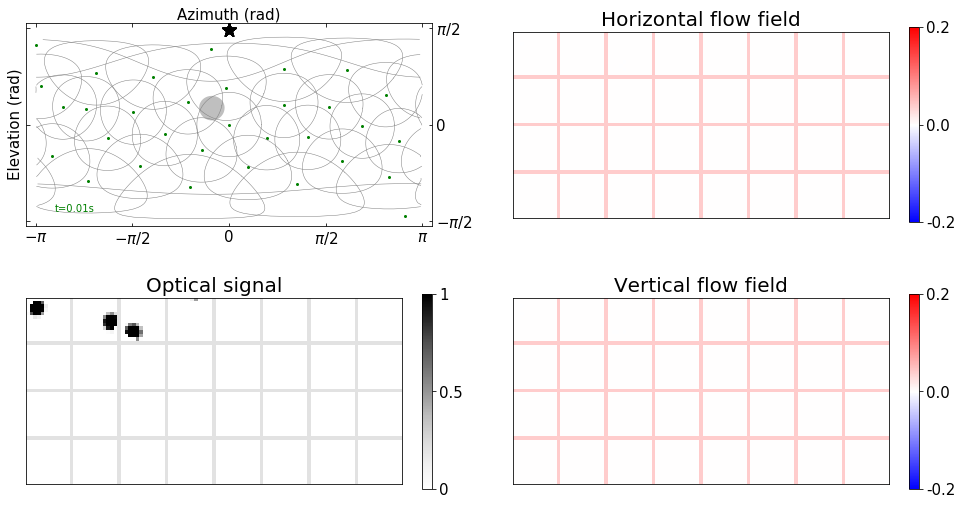

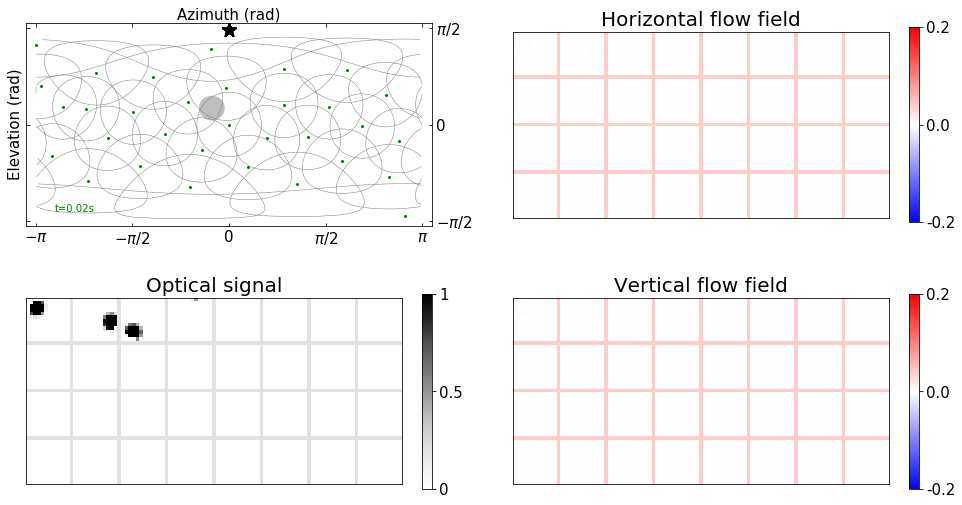

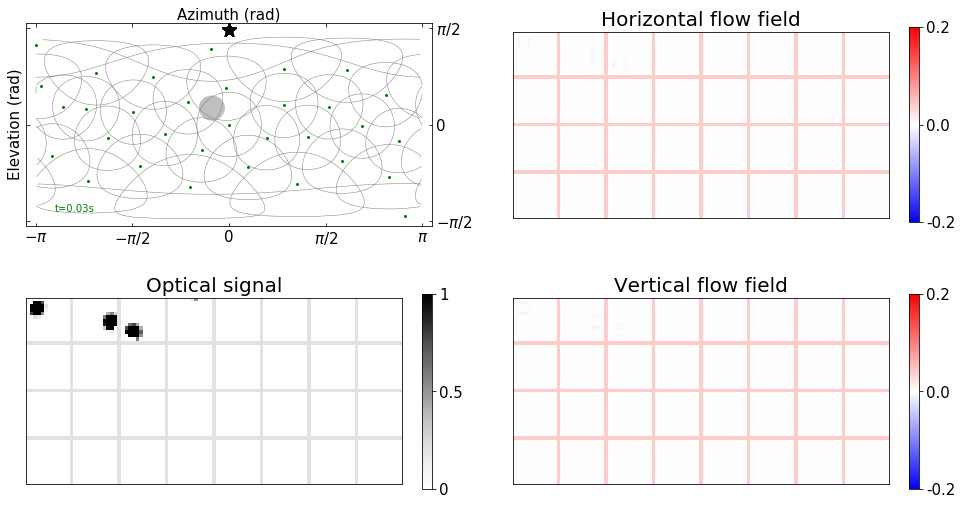

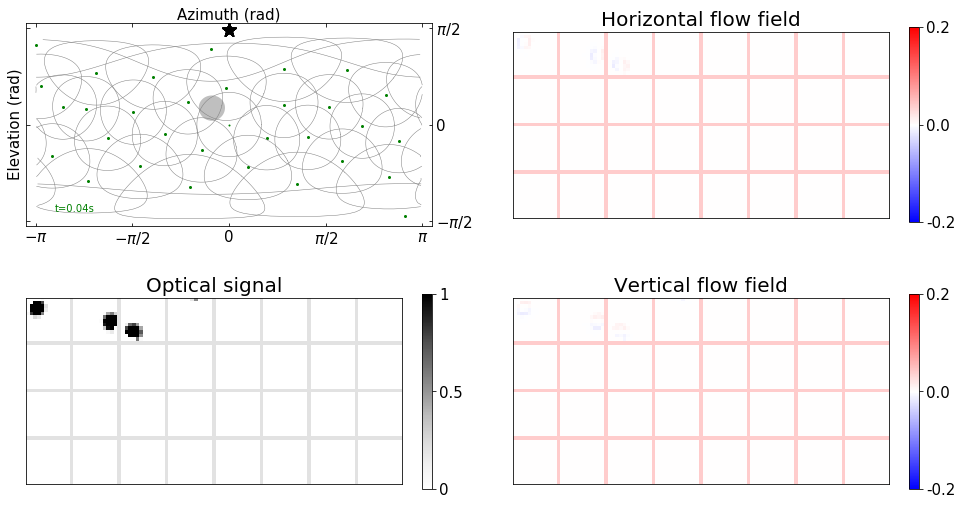

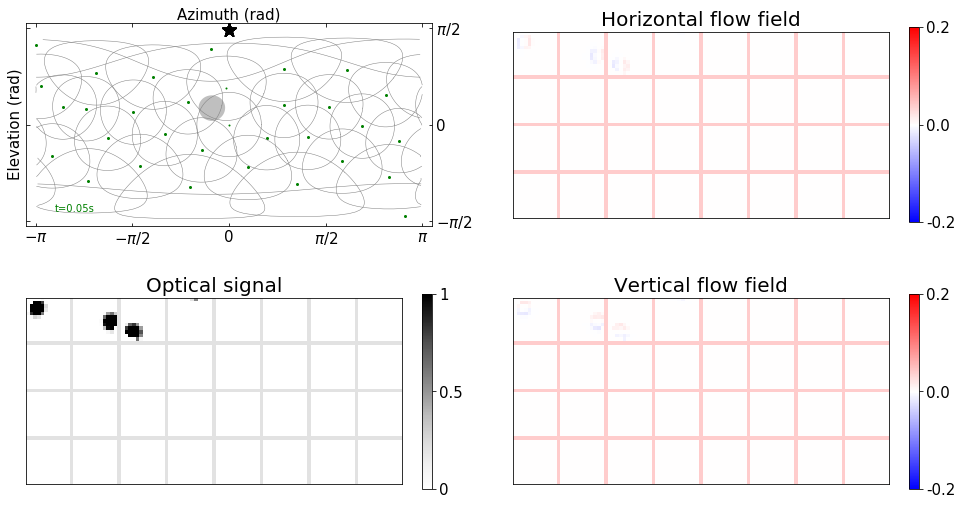

...

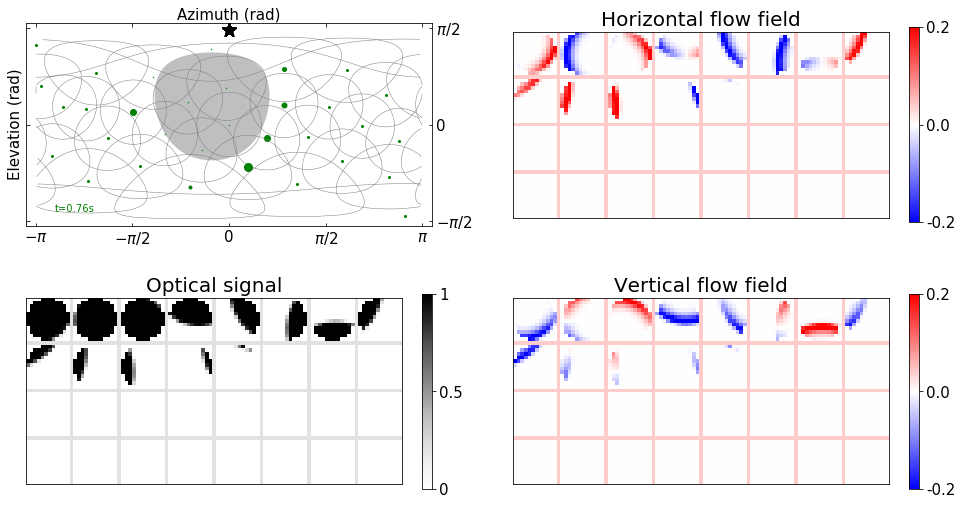

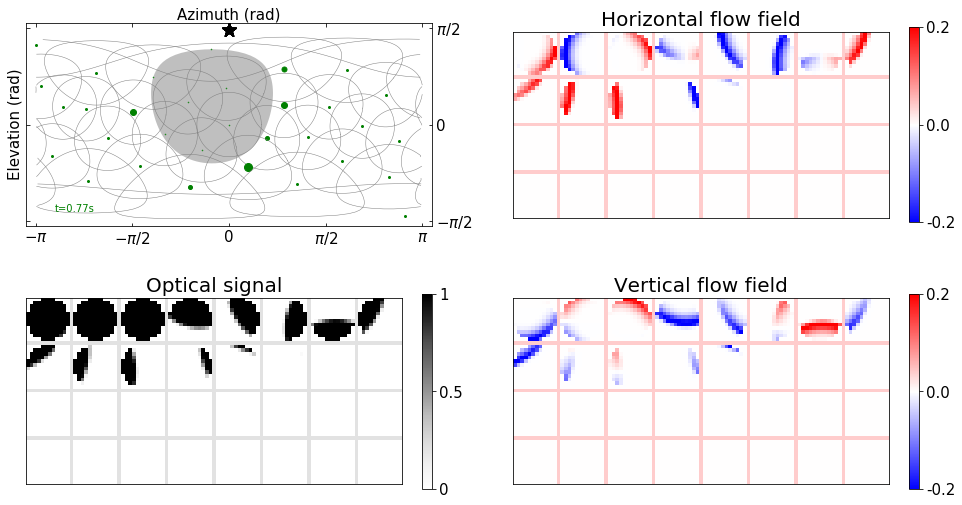

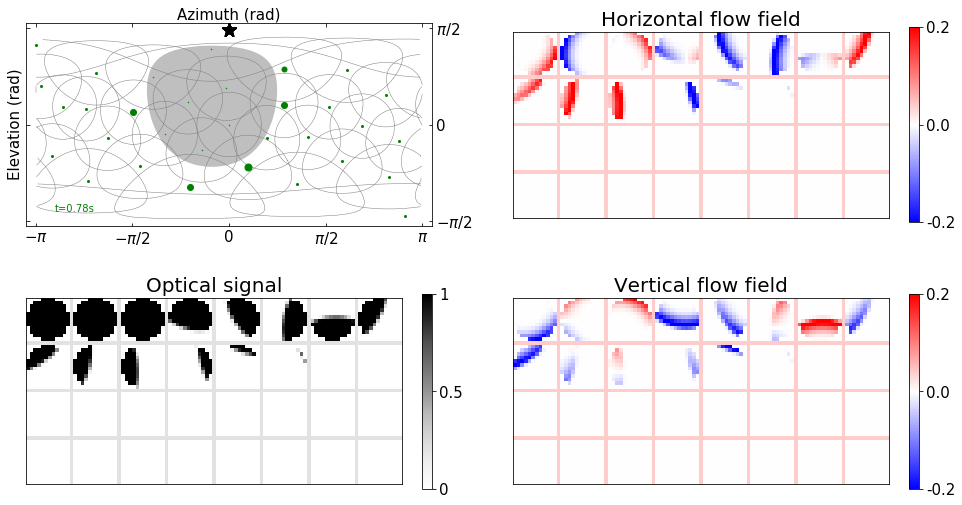

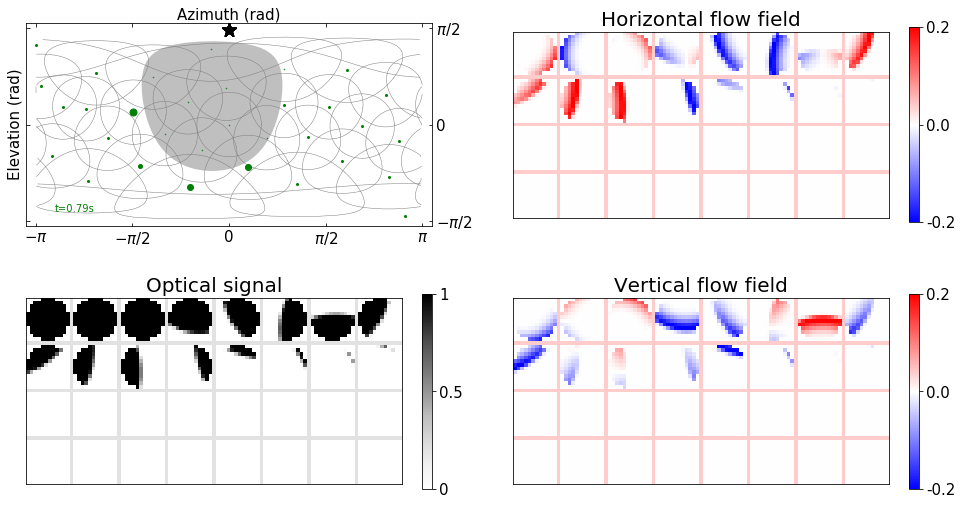

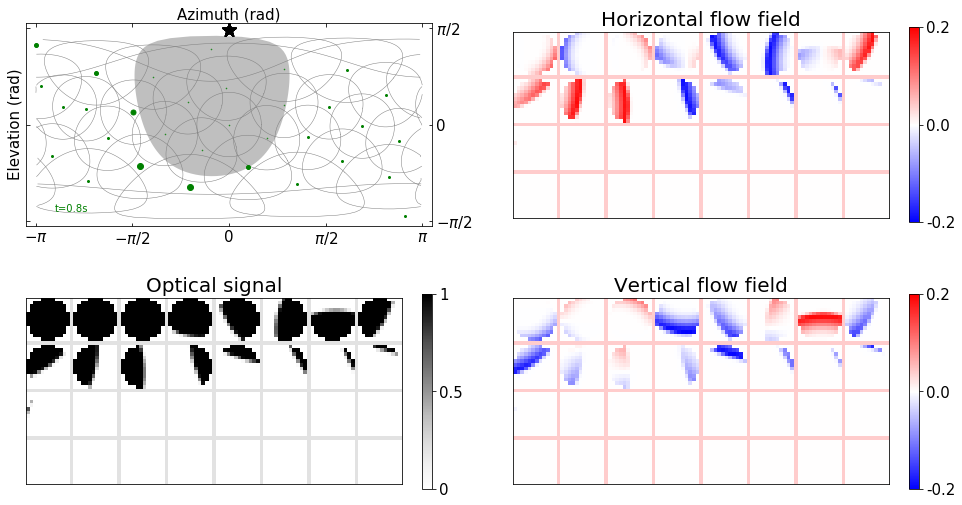

In [47]:
combined_movies_list = []
T = len(intensities_sample_cg_lplc2)
dt = 0.01
sample_dt = 0.01
color_lists = ['m', 'g']
color_map = 'Greys'
color_map_UV = LinearSegmentedColormap.from_list('br', ["b", "w", "r"], N=256)
angle_np = np.array([0., np.pi/2])
if M == 1:
    lplc2_units_coords = np.array([[0, 0, 1]])
else:
    _, lplc2_units_coords = opsg.get_lplc2_units(M)
    
N = 100
res_m = 0.8
angle_r = np.pi/6
R = 1
P = len(traj[0])
    
for t in range(T):
    fig = plt.figure(figsize=(16, 9))
    gs0 = gridspec.GridSpec(2, 2, figure=fig)
    
    ax1 = fig.add_subplot(gs0[0, 0])
    for p in range(P):
        x, y, z = traj[(t+1)*np.int(sample_dt/dt), p, :]
        angle_rb = opsg.get_angular_size(x, y, z, R)
        angle_b = opsg.get_xy_angles(x, y, z) 
        angles_on_map_b = hpfn.get_projection_one_unit(angle_mc, angle_b, angle_rb, N)
        segments_list_b = hpfn.get_segments(angles_on_map_b[3:])
        for segment in segments_list_b:
            if angles_on_map_b[2][1]+angle_rb > np.pi/2:
                ax1.fill_between(segment[:, 0], segment[:, 1], np.ones_like(segment[:, 0])*np.pi/2, \
                                 facecolor=[0.5, 0.5, 0.5], edgecolor=None, alpha=0.5)
            elif angles_on_map_b[2][1]-angle_rb < -np.pi/2:
                ax1.fill_between(segment[:, 0], segment[:, 1], -np.ones_like(segment[:, 0])*np.pi/2, \
                                 facecolor=[0.5, 0.5, 0.5], edgecolor=None, alpha=0.5)
            else:
                ax1.fill_between(segment[:, 0], segment[:, 1], facecolor=[0.5, 0.5, 0.5], edgecolor=None, alpha=0.5)
    # Plot the mapping of the units and the model responses
    for m in range(M):
        angle_m = lplc2_units[sorted_list[m]]
        angles_on_map = hpfn.get_projection_one_unit(angle_mc, angle_m, angle_r, N)
        xx = angles_on_map[0]
        yy = angles_on_map[1]
        zz = angles_on_map[2]
        xx = hpfn.get_normalized(zz, xx)
        yy = hpfn.get_normalized(zz, yy)
        if res_T[t, sorted_list[m]] == 0:
            ax1.plot(zz[0], zz[1], marker='o', markersize=1, markerfacecolor='None', markeredgecolor=color_lists[in_or_out], markeredgewidth=0.5)
        else:
            ax1.plot(zz[0], zz[1], marker='o', markersize=1+np.int(3*res_T[t, sorted_list[m]]/res_m), c=color_lists[in_or_out])
#         ax1.plot([zz[0], xx[0]], [zz[1], xx[1]], c=color_lists[in_or_out])
#         ax1.plot([zz[0], yy[0]], [zz[1], yy[1]], c='b')
#         ax1.text(zz[0]-0.2, zz[1]-0.1, np.array2string(np.array(m)), fontsize=10)
        # Add north pole
        angles_np_on_map = hpfn.get_projection_one_unit(angle_mc, angle_np, angle_r, N)
        ax1.scatter(angles_np_on_map[2][0], angles_np_on_map[2][1], s=200, c='k', marker='*')
        segments_list = hpfn.get_segments(angles_on_map[3:])
        for segment in segments_list:
            ax1.plot(segment[:, 0], segment[:, 1], c=[0.5, 0.5, 0.5], linewidth = 0.5, alpha=1)
    ax1.text(-np.pi*0.9, -np.pi/2*0.9, f't={np.round((t+1)*0.01, 2)}s', color=color_lists[in_or_out])
    ax1.set_xlim([-np.pi*1.05, np.pi*1.05])
    ax1.set_ylim([-np.pi/2*1.05, np.pi/2*1.05])
    ax1.set_xticks([-np.pi, -np.pi/2, 0., np.pi/2, np.pi])
    ax1.set_xticklabels(['$-\pi$', '$-\pi/2$', '0', '$\pi/2$', '$\pi$'])
    ax1.set_yticks([-np.pi/2, 0., np.pi/2])
    ax1.set_yticklabels(['$-\pi/2$', '0', '$\pi/2$'])
    ax1.set_xlabel('Azimuth (rad)', fontsize=15)
    ax1.set_ylabel('Elevation (rad)', fontsize=15)
    ax1.set_aspect('equal', adjustable='box')
    ax1.xaxis.set_label_position('top')
    ax1.yaxis.tick_right()
    ax1.tick_params(direction='in', labelsize=15, bottom=True, top=True, left=True, right=True)
        
    ax2 = fig.add_subplot(gs0[1, 0])
    extreme = np.amax(intensities_sample_cg_lplc2[0])
    color_norm = mpl.colors.Normalize(vmin=0, vmax=extreme)
    im2 = ax2.imshow(intensities_sample_cg_lplc2[t], norm=color_norm, cmap=color_map)
    ax2.set_xticks([])
    ax2.set_yticks([])
    ax2.set_title('Optical signal', fontsize=20)
    cbar = plt.colorbar(im2, ax=ax2, orientation='vertical', fraction=.024, ticks=[0, 0.5, 1])
    cbar.ax.tick_params(labelsize=15)
    cbar.ax.set_yticklabels((0, 0.5, 1))
    
    ax3 = fig.add_subplot(gs0[0, 1])
    extreme = 0.2
    color_norm = mpl.colors.Normalize(vmin=-extreme, vmax=extreme)
    im3 = ax3.imshow(U_flow_lplc2[t], norm=color_norm, cmap=color_map_UV)
    ax3.set_xticks([])
    ax3.set_yticks([])
    ax3.set_title('Horizontal flow field', fontsize=20)
    cbar = plt.colorbar(im3, ax=ax3, orientation='vertical', fraction=.024, ticks=[-0.2, 0.0, 0.2])
    cbar.ax.tick_params(labelsize=15)
    cbar.ax.set_yticklabels((-0.2, 0.0, 0.2))
    
    ax4 = fig.add_subplot(gs0[1, 1])
    extreme = 0.2
    color_norm = mpl.colors.Normalize(vmin=-extreme, vmax=extreme)
    im4 = ax4.imshow(V_flow_lplc2[t], norm=color_norm, cmap=color_map_UV)
    ax4.set_xticks([])
    ax4.set_yticks([])
    ax4.set_title('Vertical flow field', fontsize=20)
    cbar = plt.colorbar(im4, ax=ax4, orientation='vertical', fraction=.024, ticks=[-0.2, 0.0, 0.2])
    cbar.ax.tick_params(labelsize=15)
    cbar.ax.set_yticklabels((-0.2, 0.0, 0.2))
    
    save_file = figure_path+'movies/model_response/movie_intensities_multi_units/'+filter_type+'/'\
               +data_type+'/combined_movies_{}.png'.format(t+1)
    fig.savefig(save_file, dpi=300, bbox_inches='tight')
    combined_movies = imageio.imread(save_file)
    combined_movies_list.append(combined_movies)
    
np.save(figure_path+'movies/model_response/movie_intensities_multi_units/'+filter_type+'/'\
        +data_type+f'/combined_movies_list_M{M}_sn{sample_number}', combined_movies_list)

filter_types = ['outward', 'inward']
filter_type = filter_types[in_or_out]


In [48]:
M = 32
filter_types = ['outward', 'inward']
data_types = ['hit', 'miss', 'retreat', 'rotation']

for filter_type in filter_types:
    for data_type in data_types:

        combined_movies_list = np.load(figure_path+'movies/model_response/movie_intensities_multi_units/'+filter_type+'/'\
                               +data_type+f'/combined_movies_list_M{M}_sn{sample_number}.npy')
        imageio.mimsave(figure_path+'movies/model_response/'\
                        +filter_type+'_'+data_type+f'_M{M}_sn{sample_number}'+'.mp4', combined_movies_list, fps = 10)


IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (4007, 2100) to (4016, 2112) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).
IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (4007, 2100) to (4016, 2112) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).
IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (4007, 2100) to (4016, 2112) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).
IMAGEIO FFMPEG_WRITER WARNIN